In [1]:
%matplotlib inline
import numpy as np
from scipy.io import wavfile
from IPython.display import display, Audio

In [2]:
def sine_wave(fs, note_number, velocity, gate):
    length_of_s = int(fs * gate)
    s = np.zeros(length_of_s)
    f = 440 * np.power(2, (note_number - 69) / 12)
    for n in range(length_of_s):
        s[n] = np.sin(2 * np.pi * f * n / fs)

    for n in range(int(fs * 0.01)):
        s[n] *= n / (fs * 0.01)
        s[length_of_s - n - 1] *= n / (fs * 0.01)

    gain = velocity / 127 / np.max(np.abs(s))
    s *= gain
    return s

In [3]:
def square_wave(fs, note_number, velocity, gate):
    length_of_s = int(fs * gate)
    s = np.zeros(length_of_s)
    f0 = 440 * np.power(2, (note_number - 69) / 12)
    x = 0
    for n in range(length_of_s):
        if x < 0.5:
            s[n] = 1
        else:
            s[n] = -1

        delta = f0 / fs
        if 0 <= x and x < delta:
            t = x / delta
            d = -t * t + 2 * t - 1
            s[n] += d
        elif 1 - delta < x and x <= 1:
            t = (x - 1) / delta
            d = t * t + 2 * t + 1
            s[n] += d

        if 0.5 <= x and x < 0.5 + delta:
            t = (x - 0.5) / delta
            d = -t * t + 2 * t - 1
            s[n] -= d
        elif 0.5 - delta < x and x <= 0.5:
            t = (x - 0.5) / delta
            d = t * t + 2 * t + 1
            s[n] -= d

        x += delta
        if x >= 1:
            x -= 1
    
    for n in range(int(fs * 0.01)):
        s[n] *= n / (fs * 0.01)
        s[length_of_s - n - 1] *= n / (fs * 0.01)
    
    gain = velocity / 127 / np.max(np.abs(s))
    s *= gain
    return s

In [4]:
def read_variable_length_data(data, offset):
    d = 0
    n = 0
    while 1:
        if data[offset + n] >= 0x80:
            d = (d << 7) + data[offset + n] - 0x80
            n += 1
        else:
            d = (d << 7) + data[offset + n]
            n += 1
            break

    return d, n

In [5]:
def decode(file_name):
    file = open(file_name, 'rb')
    data = file.read()
    file.close

    offset = 0
    offset += 4 # MThd
    offset += 4 # data size

    format_type = (data[8] << 8) + data[9]
    number_of_track = (data[10] << 8) + data[11]
    division = (data[12] << 8) + data[13]
    offset += 6

    note = np.zeros((256, 3), dtype = np.int)
    score = np.empty(0, dtype = np.int)
    end_of_track = 0
    i = 0

    for j in range(number_of_track):
        offset += 4 # MTrk

        MTrk_size = 0
        for n in range(4):
            MTrk_size = (MTrk_size << 8) + data[offset + n]

        offset += 4

        end_of_data = offset + MTrk_size
        time = 0
        m = 0
        while offset < end_of_data:
            delta_time, n = read_variable_length_data(data, offset)
            offset += n
            time += delta_time

            if data[offset] == 0xFF: # meta event
                type = 16
                offset += 1
            elif data[offset] >= 0xF0: # system exclusive message
                type = 15
                offset += 1
            elif data[offset] >= 0xE0: # pitch bend
                type = 14
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0xD0: # channel pressure
                type = 13
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0xC0: # program change
                type = 12
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0xB0: # control change
                type = 11
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0xA0: # polyphonic key pressure
                type = 10
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0x90: # note on
                type = 9
                channel = data[offset] & 0x0F
                offset += 1
            elif data[offset] >= 0x80: # note off
                type = 8
                channel = data[offset] & 0x0F
                offset += 1

            if type == 16:
                if data[offset] == 0x51:
                    tempo = 0
                    for n in range(3):
                        tempo = (tempo << 8) + data[offset + 2 + n]

                    offset += 5
                elif data[offset] == 0x2F and data[offset + 1] == 0x00:
                    if time > end_of_track:
                        end_of_track = time

                    offset += 2
                else:
                    d, n = read_variable_length_data(data, offset + 1)
                    offset += 1 + n + d

            elif type == 15:
                d, n = read_variable_length_data(data, offset)
                offset += n + d
            elif type == 14:
                offset += 2
            elif type == 13:
                offset += 1
            elif type == 12:
                program_number = data[offset]
                offset += 1
            elif type == 11:
                offset += 2
            elif type == 10:
                offset += 2
            elif type == 9 or type == 8:
                note_number = data[offset]
                velocity = data[offset + 1]
                if type == 9 and velocity > 0:
                    m = np.mod(m + 1, 256)
                    note[m, 0] = time
                    note[m, 1] = note_number
                    note[m, 2] = velocity
                else:
                    for m in range(256):
                        if note[m, 1] == note_number:
                            break

                    score = np.append(score, j) # track
                    score = np.append(score, note[m, 0]) # onset
                    score = np.append(score, note[m, 1]) # note_number
                    score = np.append(score, note[m, 2]) # velocity
                    score = np.append(score, time - note[m, 0]) # gate
                    i += 1

                    note[m, 0] = 0
                    note[m, 1] = 0
                    note[m, 2] = 0

                offset += 2

    score = score.reshape(i, 5)

    return division, tempo, number_of_track, end_of_track, score

In [6]:
division, tempo, number_of_track, end_of_track, score = decode('mario.mid')

tempo = 60 / (tempo / 1000000)
number_of_track = int(number_of_track - 1)
end_of_track = (end_of_track / division) * (60 / tempo)
number_of_note = score.shape[0]

<ipython-input-5-e9c214658289>:15: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  note = np.zeros((256, 3), dtype = np.int)
<ipython-input-5-e9c214658289>:16: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20

In [7]:
fs = 44100
length_of_s_master = int(fs * (end_of_track + 2))
track = np.zeros((length_of_s_master, number_of_track))

In [8]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 0:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [9]:
s_track = np.zeros(length_of_s_master)
j = 0
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track1.wav', fs, s_track.astype(np.int16))

In [10]:
Audio('track1.wav')

In [11]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 1:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [12]:
s_track = np.zeros(length_of_s_master)
j = 1
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track2.wav', fs, s_track.astype(np.int16))

In [13]:
Audio('track2.wav')

In [14]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 2:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [15]:
s_track = np.zeros(length_of_s_master)
j = 2
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track3.wav', fs, s_track.astype(np.int16))

In [16]:
Audio('track3.wav')

In [17]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 3:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [18]:
s_track = np.zeros(length_of_s_master)
j = 3
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track4.wav', fs, s_track.astype(np.int16))

In [19]:
Audio('track4.wav')

In [20]:
fs, bass_drum = wavfile.read('bass_drum.wav')
bass_drum = bass_drum.astype(np.float)
length_of_bass_drum = len(bass_drum)
np.random.seed(0)
for n in range(length_of_bass_drum):
    bass_drum[n] = bass_drum[n] + 32768 + (np.random.rand() - 0.5)
    bass_drum[n] = bass_drum[n] / 65536 * 2 - 1

<ipython-input-20-ad6d31577f82>:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bass_drum = bass_drum.astype(np.float)


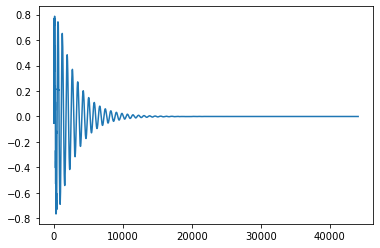

In [21]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(bass_drum)

In [22]:
fs, snare_drum = wavfile.read('snare_drum.wav')
snare_drum = snare_drum.astype(np.float)
length_of_snare_drum = len(snare_drum)
np.random.seed(0)
for n in range(length_of_snare_drum):
    snare_drum[n] = snare_drum[n] + 32768 + (np.random.rand() - 0.5)
    snare_drum[n] = snare_drum[n] / 65536 * 2 - 1

<ipython-input-22-79b460446669>:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  snare_drum = snare_drum.astype(np.float)


In [23]:
fs, hihat_cymbal_close = wavfile.read('hihat_cymbal_close.wav')
hihat_cymbal_close = hihat_cymbal_close.astype(np.float)
length_of_hihat_cymbal_close = len(hihat_cymbal_close)
np.random.seed(0)
for n in range(length_of_hihat_cymbal_close):
    hihat_cymbal_close[n] = hihat_cymbal_close[n] + 32768 + (np.random.rand() - 0.5)
    hihat_cymbal_close[n] = hihat_cymbal_close[n] / 65536 * 2 - 1

<ipython-input-23-53b4aecb9565>:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  hihat_cymbal_close = hihat_cymbal_close.astype(np.float)


In [24]:
fs, hihat_cymbal_open = wavfile.read('hihat_cymbal_open.wav')
hihat_cymbal_open = hihat_cymbal_open.astype(np.float)
length_of_hihat_cymbal_open = len(hihat_cymbal_open)
np.random.seed(0)
for n in range(length_of_hihat_cymbal_open):
    hihat_cymbal_open[n] = hihat_cymbal_open[n] + 32768 + (np.random.rand() - 0.5)
    hihat_cymbal_open[n] = hihat_cymbal_open[n] / 65536 * 2 - 1

<ipython-input-24-08d8b4ef8d3f>:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  hihat_cymbal_open = hihat_cymbal_open.astype(np.float)


In [25]:
fs, crash_cymbal = wavfile.read('crash_cymbal.wav')
crash_cymbal = crash_cymbal.astype(np.float)
length_of_crash_cymbal = len(crash_cymbal)
np.random.seed(0)
for n in range(length_of_crash_cymbal):
    crash_cymbal[n] = crash_cymbal[n] + 32768 + (np.random.rand() - 0.5)
    crash_cymbal[n] = crash_cymbal[n] / 65536 * 2 - 1

<ipython-input-25-e155502aa4f0>:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  crash_cymbal = crash_cymbal.astype(np.float)


In [26]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 4:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        
        if note_number == 35:
            s = np.zeros(length_of_bass_drum)
            gain = velocity / 127 / np.max(np.abs(bass_drum))
            s = bass_drum * gain
        elif note_number == 38:
            s = np.zeros(length_of_snare_drum)
            gain = velocity / 127 / np.max(np.abs(snare_drum))
            s = snare_drum * gain
        elif note_number == 42:
            s = np.zeros(length_of_hihat_cymbal_close)
            gain = velocity / 127 / np.max(np.abs(snare_drum))
            s = hihat_cymbal_close * gain
        elif note_number == 46:
            s = np.zeros(length_of_hihat_cymbal_open)
            gain = velocity / 127 / np.max(np.abs(snare_drum))
            s =  hihat_cymbal_open * gain
        elif note_number == 49:
            s = np.zeros(length_of_crash_cymbal)
            gain = velocity / 127 / np.max(np.abs(snare_drum))
            s = crash_cymbal * gain
        else:
            s = np.zeros(1)
        
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

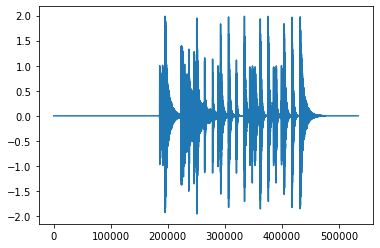

In [27]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(track[:, 4])

In [28]:
s_track = np.zeros(length_of_s_master)
j = 4
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track5.wav', fs, s_track.astype(np.int16))

In [29]:
Audio('track5.wav')

In [30]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 5:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [31]:
s_track = np.zeros(length_of_s_master)
j = 5
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track6.wav', fs, s_track.astype(np.int16))

In [32]:
Audio('track6.wav')

In [33]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 6:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [34]:
s_track = np.zeros(length_of_s_master)
j = 6
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track7.wav', fs, s_track.astype(np.int16))

In [35]:
Audio('track7.wav')

In [36]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 7:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [37]:
s_track = np.zeros(length_of_s_master)
j = 7
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track8.wav', fs, s_track.astype(np.int16))

In [38]:
Audio('track8.wav')

In [39]:
for i in range(number_of_note):
    j = int(score[i, 0] - 1)
    if j == 8:
        onset = (score[i, 1] / division) * (60 / tempo)
        note_number = score[i, 2]
        velocity = score[i, 3]
        gate = (score[i, 4] / division) * (60 / tempo)
        s = square_wave(fs, note_number, velocity, gate)
        length_of_s = len(s)
        offset = int(fs * onset)
        for n in range(length_of_s):
            track[offset + n, j] += s[n]

In [40]:
s_track = np.zeros(length_of_s_master)
j = 8
for n in range(length_of_s_master):
    s_track[n] = track[n, j]

for n in range(length_of_s_master):
    s_track[n] = (s_track[n] + 1) / 2 * 65536
    s_track[n] = int(s_track[n] + 0.5)
    if s_track[n] > 65535:
        s_track[n] = 65535
    elif s_track[n] < 0:
        s_track[n] = 0

    s_track[n] -= 32768

wavfile.write('track9.wav', fs, s_track.astype(np.int16))

In [41]:
Audio('track9.wav')

In [42]:
s_master = np.zeros((length_of_s_master, 2))

v = np.array([0.2, 0.2, 0.2, 0.2, 1, 0.2, 0.2, 0.2, 0.2])
p = np.array([0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5])

for i in range(number_of_track): # number_of_track
    s_master[:, 0] += track[:, i] * v[i] * np.cos(np.pi * p[i] / 2)
    s_master[:, 1] += track[:, i] * v[i] * np.sin(np.pi * p[i] / 2)

master_volume = 0.5
s_master /= np.max(np.abs(s_master))
s_master *= master_volume

for n in range(length_of_s_master):
    s_master[n, 0] = (s_master[n, 0] + 1) / 2 * 65536
    s_master[n, 0] = int(s_master[n, 0] + 0.5)
    if s_master[n, 0] > 65535:
        s_master[n, 0] = 65535
    elif s_master[n, 0] < 0:
        s_master[n, 0] = 0

    s_master[n, 0] -= 32768

    s_master[n, 1] = (s_master[n, 1] + 1) / 2 * 65536
    s_master[n, 1] = int(s_master[n, 1] + 0.5)
    if s_master[n, 1] > 65535:
        s_master[n, 1] = 65535
    elif s_master[n, 1] < 0:
        s_master[n, 1] = 0

    s_master[n, 1] -= 32768

wavfile.write('mario.wav', fs, s_master.astype(np.int16))

In [43]:
Audio('mario.wav')